# Nome: Leandro Correia Santos de Oliveira
# Matrícula: 3260176

## Import all packages need in the cell below

In [25]:
using Optim, Plots, NLsolve, Optim, LinearAlgebra

## 1 - FONC example

Plot the graphics of $f(x) = (x_1 - 3)^2 + (x_2 + 4)^2$

$f(x_1,x_2) = (x_1 - 3)^2 + (x_2 + 4)^2$

$\nabla f(x*)=0  $

$
\nabla f(x) = \left(\frac{\partial f}{\partial x_1}, \frac{\partial f}{\partial x_2} \right)
$

In [3]:
using Plots

In [8]:
# Definição da função
f(x1, x2) = (x1 - 3)^2 + (x2 + 4)^2

f (generic function with 1 method)

In [6]:

# Gradiente (para referência)
∇f(x1, x2) = [2*(x1 - 3), 2*(x2 + 4)]

∇f (generic function with 1 method)

In [7]:

# Grade de pontos
x1_vals = range(-2, 8, length=300)
x2_vals = range(-9, 1, length=300)

# Avaliação da função na malha
Z = [f(x1, x2) for x2 in x2_vals, x1 in x1_vals]

# Ponto que satisfaz a FONC
x1_star = 3
x2_star = -4


-4

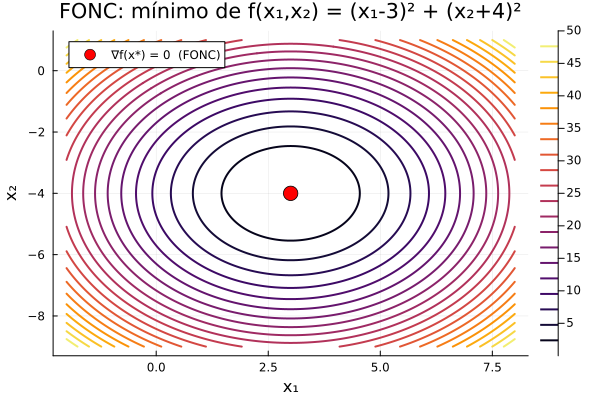

In [8]:

# Plot das curvas de nível
contour(
    x1_vals,
    x2_vals,
    Z,
    levels=20,
    linewidth=2,
    xlabel="x₁",
    ylabel="x₂",
    title="FONC: mínimo de f(x₁,x₂) = (x₁-3)² + (x₂+4)²",
    colorbar=true
)

# Marcar o ponto ótimo
scatter!(
    [x1_star],
    [x2_star],
    markersize=8,
    markercolor=:red,
    label="∇f(x*) = 0  (FONC)"
)


## 2 - Solving the FONC

Given the function $z = (x_1 - 1)^4 + (x_2 - 2)^4$:

* using the optim.jl package, find the minimum of z.
* using the NLsolve.jl package, solve the FONC problem for this function



Finding the minimum of z, given the function $z = (x_1 - 1)^4 + (x_2 - 2)^4$:


In [15]:
using Optim

In [22]:

# Função objetivo
function z(x)
    return (x[1] - 1)^4 + (x[2] - 2)^4
end


z (generic function with 1 method)

In [17]:
x0 = [0.0, 0.0]

2-element Vector{Float64}:
 0.0
 0.0

In [20]:
resultado = optimize(z, x0, BFGS())
x_min = Optim.minimizer(resultado)
z_min = Optim.minimum(resultado)

4.632267842351608e-13

In [21]:

println("Ponto ótimo encontrado:")
println("x1 = ", x_min[1])
println("x2 = ", x_min[2])

println("Valor mínimo da função:")
println("z_min = ", z_min)


Ponto ótimo encontrado:
x1 = 0.9993307703501523
x2 = 2.0007158804901986
Valor mínimo da função:
z_min = 4.632267842351608e-13


## 2.1 - Using the NLsolve.jl package, solve the FONC problem for the function $z = (x_1 - 1)^4 + (x_2 - 2)^4$:

$\nabla z(x_1,x_2)=0  $

$z = (x_1 - 1)^4 + (x_2 - 2)^4$:

$
\nabla z(x) = \left(\frac{\partial z}{\partial x_1}, \frac{\partial z}{\partial x_2} \right)
$

In [31]:
using NLsolve

In [4]:

function fonc!(F, x)
    F[1] = 4 * (x[1] - 1)^3
    F[2] = 4 * (x[2] - 2)^3
end


fonc! (generic function with 1 method)

In [5]:
# Chute inicial
x0 = [0.0, 0.0]

2-element Vector{Float64}:
 0.0
 0.0

In [6]:
resultado = nlsolve(fonc!, x0)

Results of Nonlinear Solver Algorithm
 * Algorithm: Trust-region with dogleg and autoscaling
 * Starting Point: [0.0, 0.0]
 * Zero: [0.9995401607802424, 1.9990803216092672]
 * Inf-norm of residuals: 0.000000
 * Iterations: 23
 * Convergence: true
   * |x - x'| < 0.0e+00: false
   * |f(x)| < 1.0e-08: true
 * Function Calls (f): 24
 * Jacobian Calls (df/dx): 24

In [7]:

x_sol = resultado.zero

println("Solução da FONC:")
println("x1 = ", x_sol[1])
println("x2 = ", x_sol[2])


Solução da FONC:
x1 = 0.9995401607802424
x2 = 1.9990803216092672


In [27]:
##

## 3 - Plot the level curve and the graphics of $f(x) = (x_1 - 3)^2 + (x_2 - 2)^2$

In [26]:
using Plots

In [27]:


# Definição da função
f(x1, x2) = (x1 - 3)^2 + (x2 - 2)^2

# Domínio
x1_vals = range(0, 6, length=300)
x2_vals = range(-1, 5, length=300)

# Avaliação da função na malha
Z = [f(x1, x2) for x2 in x2_vals, x1 in x1_vals]



300×300 Matrix{Float64}:
 18.0     17.88    17.7608  17.6424  …  17.6424  17.7608  17.88    18.0
 17.88    17.76    17.6408  17.5224     17.5224  17.6408  17.76    17.88
 17.7608  17.6408  17.5216  17.4032     17.4032  17.5216  17.6408  17.7608
 17.6424  17.5224  17.4032  17.2848     17.2848  17.4032  17.5224  17.6424
 17.5248  17.4048  17.2856  17.1673     17.1673  17.2856  17.4048  17.5248
 17.4081  17.2881  17.1689  17.0505  …  17.0505  17.1689  17.2881  17.4081
 17.2921  17.1721  17.0529  16.9345     16.9345  17.0529  17.1721  17.2921
 17.1769  17.0569  16.9377  16.8193     16.8193  16.9377  17.0569  17.1769
 17.0626  16.9426  16.8234  16.705      16.705   16.8234  16.9426  17.0626
 16.949   16.829   16.7098  16.5914     16.5914  16.7098  16.829   16.949
 16.8363  16.7163  16.5971  16.4787  …  16.4787  16.5971  16.7163  16.8363
 16.7243  16.6043  16.4851  16.3667     16.3667  16.4851  16.6043  16.7243
 16.6132  16.4932  16.374   16.2556     16.2556  16.374   16.4932  16.6132
  ⋮   

In [28]:
# Ponto mínimo
x1_star = 3
x2_star = 2



2

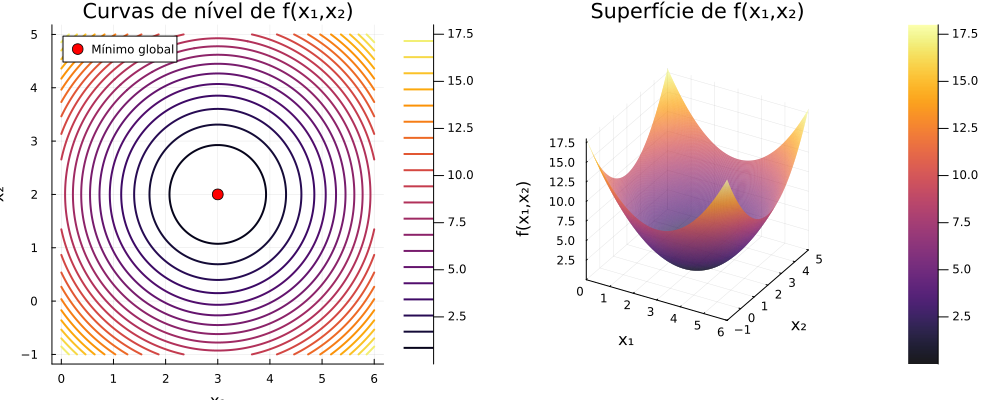

In [33]:

# =========================
# 1) Curvas de nível
# =========================
p1 = contour(
    x1_vals,
    x2_vals,
    Z,
    levels=20,
    linewidth=2,
    xlabel="x₁",
    ylabel="x₂",
    title="Curvas de nível de f(x₁,x₂)",
    colorbar=true
)

scatter!(
    p1,
    [x1_star],
    [x2_star],
    markersize=6,
    markercolor=:red,
    label="Mínimo global"
)

# =========================
# 2) Gráfico da superfície
# =========================
p2 = surface(
    x1_vals,
    x2_vals,
    Z,
    xlabel="x₁",
    ylabel="x₂",
    zlabel="f(x₁,x₂)",
    title="Superfície de f(x₁,x₂)",
    opacity=0.9
)

# Mostrar os dois gráficos lado a lado
plot(p1, p2, layout=(1,2), size=(1000,400))


### Starting from the point $x = [1.0, 1.0]$, implement the gradient descent and Newton method to find the minimum of this function.

#### Gradient Descent

$f(x) = (x_1 - 3)^2 + (x_2 - 2)^2$

In [34]:

using LinearAlgebra

# Função, gradiente e Hessiana
f(x) = (x[1] - 3)^2 + (x[2] - 2)^2
grad_f(x) = [2*(x[1] - 3), 2*(x[2] - 2)]

# Parâmetros
α = 0.1                 # passo
tol = 1e-6
max_iter = 1000

# Ponto inicial
x = [1.0, 1.0]

# Armazenar histórico
history_gd = [copy(x)]

# Gradient Descent
for k in 1:max_iter
    x_new = x - α * grad_f(x)
    push!(history_gd, copy(x_new))

    if norm(x_new - x) < tol
        break
    end
    x = x_new
end

println("Gradient Descent result:")
println("x ≈ ", x)


Gradient Descent result:
x ≈ [2.9999961687611476, 1.9999980843805738]


#### Newton Method

In [35]:

# Hessiana constante
H = [2.0 0.0;
     0.0 2.0]

# Ponto inicial
x = [1.0, 1.0]

# Armazenar histórico
history_newton = [copy(x)]

# Newton's Method
for k in 1:10
    x_new = x - H \ grad_f(x)
    push!(history_newton, copy(x_new))

    if norm(x_new - x) < tol
        break
    end
    x = x_new
end

println("Newton method result:")
println("x ≈ ", x)


Newton method result:
x ≈ [3.0, 2.0]


### Implement the same methods now for the function $f(x) = 10(x_1 - 3)^2 + 2(x_2 - 2)^2$

$f(x) = 10(x_1 - 3)^2 + 2(x_2 - 2)^2$

#### Gradiente Descendente

In [37]:

using LinearAlgebra

# Função e gradiente
f(x) = 10*(x[1] - 3)^2 + 2*(x[2] - 2)^2
grad_f(x) = [20*(x[1] - 3), 4*(x[2] - 2)]

# Parâmetros
α = 0.05               # passo menor por causa da alta curvatura
tol = 1e-6
max_iter = 1000

# Ponto inicial
x = [1.0, 1.0]

# Histórico
history_gd = [copy(x)]

# Gradient Descent
for k in 1:max_iter
    x_new = x - α * grad_f(x)
    push!(history_gd, copy(x_new))

    if norm(x_new - x) < tol
        break
    end
    x = x_new
end

println("Gradient Descent result:")
println("x ≈ ", x)


Gradient Descent result:
x ≈ [3.0, 1.9999953231947605]


#### Newton Method

In [38]:

# Hessiana constante
H = [20.0 0.0;
     0.0 4.0]

# Ponto inicial
x = [1.0, 1.0]

# Histórico
history_newton = [copy(x)]

# Newton's Method
for k in 1:10
    x_new = x - H \ grad_f(x)
    push!(history_newton, copy(x_new))

    if norm(x_new - x) < tol
        break
    end
    x = x_new
end

println("Newton method result:")
println("x ≈ ", x)


Newton method result:
x ≈ [3.0, 2.0]


Now implement the same methods for the function $f(x) = x_1^2 + x_2^2$. Use as start point $x_0 = [-2.0, 2.0]$

$f(x) = x[1]^2 + x[2]^2$

#### Gradiente Descendente

In [63]:


using LinearAlgebra

# Função e gradiente
f(x) = x[1]^2 + x[2]^2
grad_f(x) = [2*x[1], 2*x[2]]

# Parâmetros
α = 0.1
tol = 1e-6
max_iter = 5000

# Ponto inicial
x = [-2.0, 2.0]

# Gradiente Descendente
for k in 1:max_iter
    x_new = x - α * grad_f(x)
    if norm(x_new - x) < tol
        x = x_new
        break
    end
    x = x_new
end



println("Gradient Descent result:")
println("x* = ", round.(x, digits=5))
println("f(x*) = ", round(f(x), digits=5))





Gradient Descent result:
x* = [-0.0, 0.0]
f(x*) = 0.0


#### Newton Method

In [48]:

# Hessian (constant)
H = [2.0 0.0;
     0.0 2.0]

# Initial point
x = [-2.0, 2.0]

# Newton's Method loop
for k in 1:10
    x_new = x - H \ grad_f(x)
    if norm(x_new - x) < tol
        x = x_new
        break
    end
    x = x_new
end

println("\nNewton's Method result:")
println("x* = ", x)
println("f(x*) = ", f(x))



Newton's Method result:
x* = [0.0, 0.0]
f(x*) = 0.0


Implement the same methods for the function $f(x) = x_1^2 + 100x_2^2$. Use as start point $x_0 = [-2.0, 2.0]$

$f(x) = x_1^2 + 100x_2^2$

In [62]:

using LinearAlgebra

# Function
f(x) = x[1]^2 + 100*x[2]^2

# gradient
grad_f(x) = [2*x[1], 200*x[2]]

# Parameters
α = 0.005          # small step size due to ill-conditioning
tol = 1e-6
max_iter = 10_000

# Initial point
x = [-2.0, 2.0]

# Gradient Descent loop
for k in 1:max_iter
    x_new = x - α * grad_f(x)
    if norm(x_new - x) < tol
        x = x_new
        break
    end
    x = x_new
end

println("Gradient Descent result:")
println("x* = ", round.(x, digits=5))
println("f(x*) = ", round(f(x), digits=5))


Gradient Descent result:
x* = [-0.0001, 0.0]
f(x*) = 0.0


#### Newton Method

In [77]:

# Hessiana (constante)
H = [2.0 0.0;
     0.0 200.0]

# Initial point
x = [-2.0, 2.0]

# Newton loop
for k in 1:700
    x_new = x - H \ grad_f(x)
    if norm(x_new - x) < tol
        x = x_new
        break
    end
    x = x_new
end

println("\nNewton's Method result:")
println("x* = ", round.(x, digits=5))
println("f(x*) = ", round(f(x), digits=5))



Newton's Method result:
x* = [0.0, 0.00176]
f(x*) = 0.0


For the last problem, perform the change of variables: $x_2 = \frac{1}{10}y_2$

Sendo  $x_2 = \frac{1}{10}y_2$, temos que $y_2= 10x_2$

e portanto $x_1 = y_1$

$f(x) = x_1^2 + 100(\frac{1}{10}y_2)^2$. 

Reescalonado teremos:

$f(y) = y_1^2 + y_2^2$.   Starting point $x_0 = [-2.0, 2.0]$

Sendo $x_0 = [-2.0, 2.0]$, logo temos que $y_0 = [-2.0, 20.0]$

#### Gradiente Descendente

In [89]:

using LinearAlgebra

# Função e gradiente no espaço y
f_tilde(y) = y[1]^2 + y[2]^2
grad_f_tilde(y) = [2*y[1], 2*y[2]]

# Parâmetros
α = 0.1
tol = 1e-6
max_iter = 1000

# Ponto inicial reescalonado
y = [-2.0, 20.0]

# Gradiente Descendente
for k in 1:max_iter
    y_new = y - α * grad_f_tilde(y)
    if norm(y_new - y) < tol
        y = y_new
        break
    end
    y = y_new
end

println("Resultado no espaço y (GD):")
println("y* =", y)
println("f̃(y*) =", f_tilde(y))




Resultado no espaço y (GD):
y* =[-3.2910091146424137e-7, 3.2910091146424137e-6]
f̃(y*) =1.0939048402586038e-11


#### Método de Newton

In [90]:

# Hessiana constante
H = [2.0 0.0;
     0.0 2.0]

# Ponto inicial
y = [-2.0, 20.0]

# Método de Newton
for k in 1:10
    y_new = y - H \ grad_f_tilde(y)
    if norm(y_new - y) < tol
        y = y_new
        break
    end
    y = y_new
end

println("\nResultado no espaço y (Newton):")
println("y* =", y)
println("f̃(y*) =", f_tilde(y))



Resultado no espaço y (Newton):
y* =[0.0, 0.0]
f̃(y*) =0.0


##  Gradient Descent with Backtracking Line Search:

Given function:
\begin{align*}
    f(x_1, x_2, x_3) = x_{3} \log \Big( e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}} \Big) + (x_{3}-2)^2 + e^{\frac{1}{x_{1} + x_{2}}}
\end{align*}

$ \textbf{dom} \; f: \{ \mathbf{x} \in \mathbb{R}^3 : x_1 +x _2 >0, x_3 > 0 \}  $

Define the function in the cell below:

Defining the first derivative: 

$\nabla f = [ \partial f/\partial x_1 \; \partial f/\partial x_2 \; \partial f/\partial x_3]^T   $

$$ \implies \nabla f = \begin{Bmatrix}
\frac{e^{\frac{x_{1}} {x_{3}}}}{e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}} - \frac{e^{ \frac{1}{x_1 + x_2}}}{(x_1 +x_2)^2}  \\ \\
\frac{e^{\frac{x_{2}} {x_{3}}}}{e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}} - \frac{e^{ \frac{1}{x_1 + x_2}}}{(x_1 +x_2)^2} \\ \\
 log(e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}) - \frac{x_1 e^{\frac{x_{1}} {x_{3}}} + x_2 e^{\frac{x_{2}} {x_{3}}}}{x_3 ( e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}) } + 2(x_3-2)
\end{Bmatrix}$$

#### implement the first derivative 

Defining parameters for backtracking search: $\alpha = 0,4; \beta = 0,5;$ tolerance (eps) $= 10^{-5}$

Start Point: [3.0, 4.0, 5.0]

Ensuring domain:

$ \text{While} \; x + t\Delta x \notin \textbf{dom} f, \text{ set } t := \beta t $ \
where, $\Delta x = -\nabla f(x)$

Backtracking algorithm:

$
\text{Given a descent direction } \Delta x = -\nabla f(x) \text{ for } f \text{ at } x \in \textbf{dom} f, \alpha \in (0, 0.5), \beta \in (0, 1).$

\begin{array}{l}
\text{Set } t := 1. \\ 
\text{Ensure domain:} \; \text{While} \; x + t\Delta x \notin \textbf{dom} f, \text{ set } t := \beta t \\
\text{While } f(x + t\Delta x) > f(x) + \alpha t \nabla f(x)^T \Delta x, \text{ set } t := \beta t.
\end{array}


### Algorithm: Gradient Descent

1. **Input:** Starting point $x$ in $\text{dom} \, f$

2. **Repeat until stopping criterion is satisfied:**

    a. $\Delta x := -\nabla f(x)$
    
    b. **Line search:** Choose step size $t$ via backtracking line search
    
    c. **Update:** $x := x + t \Delta x$

In [20]:
using LinearAlgebra

function f(x)
    x1, x2, x3 = x
    return x3 * log(exp(x1/x3) + exp(x2/x3)) +
           (x3 - 2)^2 +
           exp(1 / (x1 + x2))
end


f (generic function with 1 method)

In [21]:

function in_domain(x)
    return (x[1] + x[2] > 0) && (x[3] > 0)
end

   

in_domain (generic function with 1 method)

In [22]:

function grad_f(x)
    x1, x2, x3 = x

    exp1 = exp(x1 / x3)
    exp2 = exp(x2 / x3)
    denom = exp1 + exp2
    exp_term = exp(1 / (x1 + x2))

    df_dx1 = exp1 / denom - exp_term / (x1 + x2)^2
    df_dx2 = exp2 / denom - exp_term / (x1 + x2)^2

    df_dx3 = log(denom) -
             (x1 * exp1 + x2 * exp2) / (x3 * denom) +
             2 * (x3 - 2)

    return [df_dx1, df_dx2, df_dx3]
end


grad_f (generic function with 1 method)

In [23]:

α = 0.4        # parâmetro de Armijo
β = 0.5        # fator de redução
ϵ = 1e-5       # tolerância (critério de parada)


1.0e-5

In [24]:

function backtracking(f, grad_f, x;
                      α = 0.4,
                      β = 0.5)

    g = grad_f(x)
    Δx = -g          # direção de descida
    t = 1.0          # passo inicial

    # 1️⃣ Garantir domínio
    while !in_domain(x + t * Δx)
        t *= β
    end

    # 2️⃣ Condição de Armijo
    fx = f(x)
    gTd = dot(g, Δx)   # = -||∇f(x)||²

    while f(x + t * Δx) > fx + α * t * gTd
        t *= β
    end

    return t
end


backtracking (generic function with 1 method)

In [25]:

function gradient_descent(f, grad_f, x0;
                          α = 0.4,
                          β = 0.5,
                          ϵ = 1e-5,
                          max_iter = 1000)

    x = copy(x0)

    for k in 1:max_iter
        g = grad_f(x)

        # Critério de parada (FONC)
        if norm(g) < ϵ
            break
        end

        t = backtracking(f, grad_f, x; α=α, β=β)
        x = x + t * (-g)
    end

    return x
end


gradient_descent (generic function with 1 method)

In [26]:

x0 = [3.0, 4.0, 5.0]

x_star = gradient_descent(f, grad_f, x0;
                          α = 0.4,
                          β = 0.5,
                          ϵ = 1e-5)

println("Start point: ", x0)
println("Solução encontrada:")
println("x* = ", x_star)
println("f(x*) = ", f(x_star))



Start point: [3.0, 4.0, 5.0]
Solução encontrada:
x* = [0.9261872701983407, 0.9262296480441212, 1.6534264097600675]
f(x*) = 3.908113786397637


#### Calcular o gradiente em x*

In [27]:
g_star = grad_f(x_star)
grad_norm = norm(g_star)


9.061686067521745e-6

In [28]:

println("Ponto final x* = ", x_star)
println("Gradiente em x* = ", g_star)
println("Norma do gradiente ||∇f(x*)|| = ", grad_norm)

if grad_norm < 1e-5
    println("✅ Critério de parada satisfeito: ||∇f(x*)|| < 1e-5")
else
    println("❌ Critério de parada NÃO satisfeito")
end


Ponto final x* = [0.9261872701983407, 0.9262296480441212, 1.6534264097600675]
Gradiente em x* = [-6.40758107955941e-6, 6.407578255096524e-6, -2.0335955142058992e-12]
Norma do gradiente ||∇f(x*)|| = 9.061686067521745e-6
✅ Critério de parada satisfeito: ||∇f(x*)|| < 1e-5


##### O algoritmo de Gradient Descent com Backtracking Line Search convergiu segundo o critério da FONC, pois a norma do gradiente no ponto final é menor que $10^{-5}$

## Optimisation using Newton's Method:

Given function:
\begin{align*}
    f(x_1, x_2, x_3) = x_{3} \log \Big( e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}} \Big) + (x_{3}-2)^2 + e^{\frac{1}{x_{1} + x_{2}}}
\end{align*}

$ \textbf{dom} \; f: \{ \mathbf{x} \in \mathbb{R}^3 : x_1 +x _2 >0, x_3 > 0 \}  $

Defining the first derivative: 

$\nabla f = [ \partial f/\partial x_1 \; \partial f/\partial x_2 \; \partial f/\partial x_3]^T   $

$$ \implies \nabla f = \begin{Bmatrix}
\frac{e^{\frac{x_{1}} {x_{3}}}}{e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}} - \frac{e^{ \frac{1}{x_1 + x_2}}}{(x_1 +x_2)^2}  \\ \\
\frac{e^{\frac{x_{2}} {x_{3}}}}{e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}} - \frac{e^{ \frac{1}{x_1 + x_2}}}{(x_1 +x_2)^2} \\ \\
 log(e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}) - \frac{x_1 e^{\frac{x_{1}} {x_{3}}} + x_2 e^{\frac{x_{2}} {x_{3}}}}{x_3 ( e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}) } + 2(x_3-2)
\end{Bmatrix}$$

Defining the Second Derivative:

The gradient vector, denoted as $\nabla f$, is the vector of partial derivatives:
$
\nabla f(x) = \left(\frac{\partial f}{\partial x_1}, \frac{\partial f}{\partial x_2}, \ldots, \frac{\partial f}{\partial x_n}\right)
$

The finite difference approximation for the gradient at a point $x$ is given by:
$
\nabla_f(x) \approx \frac{f(x + h\mathbf{i}) - f(x)}{h}
$
where $\mathbf{i}$ is a unit vector along one of the coordinate axes.

The second derivative matrix is then approximated as:
$
\nabla^2 f(x) \approx \frac{1}{h} \left(\nabla_f(x + h\mathbf{i}) - \nabla_f(x)\right)
$

The reshaped second derivative matrix is a $3 \times 3$ matrix obtained from the flattened vector.

Defining parameters for backtracking search and the start point: $\alpha = 0,4; \beta = 0,5;$ tolerance (eps) $= 10^{-5}$; Start Point: [3.0, 4.0, 5.0]

Ensuring domain:

$ \text{While} \; x + t\Delta x \notin \textbf{dom} f, \text{ set } t := \beta t $ \
where
$\Delta x = -\nabla^2 f(x)^{-1} \nabla f(x)$

Backtracking algorithm:

$
\text{Given a descent direction } \Delta x = -\nabla^2 f(x)^{-1} \nabla f(x) \text{ for } f \text{ at } x \in \textbf{dom} f, \alpha \in (0, 0.5), \beta \in (0, 1).$

\begin{array}{l}
\text{Set } t := 1. \\ 
\text{Ensure domain:} \; \text{While} \; x + t\Delta x \notin \textbf{dom} f, \text{ set } t := \beta t \\
\text{While } f(x + t\Delta x) > f(x) + \alpha t \nabla f(x)^T \Delta x, \text{ set } t := \beta t.
\end{array}


In [2]:
using LinearAlgebra


function f(x)
    x1, x2, x3 = x
    return x3 * log(exp(x1/x3) + exp(x2/x3)) +
           (x3 - 2)^2 +
           exp(1 / (x1 + x2))
end


function in_domain(x)
    return (x[1] + x[2] > 0) && (x[3] > 0)
end


function grad_fd(f, x; h = 1e-6)
    n = length(x)
    g = zeros(n)

    fx = f(x)
    for i in 1:n
        e = zeros(n)
        e[i] = 1.0
        g[i] = (f(x + h * e) - fx) / h
    end

    return g
end



grad_fd (generic function with 1 method)

In [4]:

function hess_fd(f, x; h = 1e-6)
    n = length(x)
    H = zeros(n, n)

    g0 = grad_fd(f, x; h=h)

    for i in 1:n
        e = zeros(n)
        e[i] = 1.0
        g1 = grad_fd(f, x + h * e; h=h)
        H[:, i] = (g1 - g0) / h
    end

    return H
end
    
function backtracking_newton(f, x, Δx, g;
                             α = 0.4,
                             β = 0.5)

    t = 1.0
    fx = f(x)
    gTd = dot(g, Δx)   # < 0 para direção de Newton válida

    # Garantir domínio
    while !in_domain(x + t * Δx)
        t *= β
    end

    # Condição de Armijo
    while f(x + t * Δx) > fx + α * t * gTd
        t *= β
    end

    return t
end

function newton_method(f, x0;
                       α = 0.4,
                       β = 0.5,
                       ϵ = 1e-5,
                       max_iter = 50)

    x = copy(x0)

    for k in 1:max_iter
        g = grad_fd(f, x)

        # Critério de parada
        if norm(g) < ϵ
            break
        end

        H = hess_fd(f, x)

        # Direção de Newton (resolver sistema linear)
        Δx = - H \ g

        # Backtracking
        t = backtracking_newton(f, x, Δx, g;
                                α=α, β=β)

        # Atualização
        x = x + t * Δx
    end

    return x
end


x0 = [3.0, 4.0, 5.0]

x_star = newton_method(f, x0;
                       α = 0.4,
                       β = 0.5,
                       ϵ = 1e-5)

println("Start point: ", x0)
println("Solução encontrada (Newton):")
println("x* = ", x_star)
println("f(x*) = ", f(x_star))
println("||∇f(x*)|| = ", norm(grad_fd(f, x_star)))


Start point: [3.0, 4.0, 5.0]
Solução encontrada (Newton):
x* = [0.9262081943830808, 0.9262080842813495, 1.6534259120167119]
f(x*) = 3.9081137862622555
||∇f(x*)|| = 3.693423507199567e-8


###### O método de Newton com Backtracking Line Search convergiu segundo o critério da FONC, utilizando gradiente e Hessiana aproximados por diferenças finitas, respeitando o domínio da função e os parâmetros fornecidos

### Newton's Algorithm

**Input:** (defined earlier)
- Starting point $x \in \text{dom} \, f$
- Tolerance $\varepsilon > 0$

**Repeat:**
1. Compute the Newton step and decrement.
   $
   \Delta x_{nt} := -\nabla^2 f(x)^{-1}\nabla f(x); \quad \lambda^2 := \nabla f(x)^T \nabla^2 f(x)^{-1}\nabla f(x)
   $
2. Stopping criterion. $\textbf{quit}$ if $\lambda^2/2 \leq \varepsilon.$
3. Line search. Choose step size $t$ by backtracking line search; ensuring update $ := x + t \Delta x$ lies in $\mathbf{dom} f$ throughout.
4. Update. $x := x + t\Delta x_{nt}$.

In [ ]:
# code and results (including # of iterations)

In [6]:
using LinearAlgebra


function f(x)
    x1, x2, x3 = x
    return x3 * log(exp(x1/x3) + exp(x2/x3)) +
           (x3 - 2)^2 +
           exp(1 / (x1 + x2))
end


function in_domain(x)
    return (x[1] + x[2] > 0) && (x[3] > 0)
end


in_domain (generic function with 1 method)

#### Gradiente por diferenças finitas

In [7]:

function grad_fd(f, x; h = 1e-6)
    n = length(x)
    g = zeros(n)
    fx = f(x)

    for i in 1:n
        e = zeros(n)
        e[i] = 1.0
        g[i] = (f(x + h * e) - fx) / h
    end

    return g
end


grad_fd (generic function with 1 method)

#### Hessiana por diferenças finitas do gradiente

In [8]:

function hess_fd(f, x; h = 1e-6)
    n = length(x)
    H = zeros(n, n)

    g0 = grad_fd(f, x; h=h)

    for i in 1:n
        e = zeros(n)
        e[i] = 1.0
        g1 = grad_fd(f, x + h * e; h=h)
        H[:, i] = (g1 - g0) / h
    end

    return H
end


hess_fd (generic function with 1 method)

#### Backtracking Line Search

In [9]:

function backtracking_newton(f, x, Δx, g;
                             α = 0.4,
                             β = 0.5)

    t = 1.0
    fx = f(x)
    gTd = dot(g, Δx)   # = -λ² < 0

    # Garantir domínio
    while !in_domain(x + t * Δx)
        t *= β
    end

    # Condição de Armijo
    while f(x + t * Δx) > fx + α * t * gTd
        t *= β
    end

    return t
end


backtracking_newton (generic function with 1 method)

### Algoritmo de Newton Clássico

In [10]:

function newton_classic(f, x0;
                        α = 0.4,
                        β = 0.5,
                        ϵ = 1e-5,
                        max_iter = 50)

    x = copy(x0)

    for k in 1:max_iter
        g = grad_fd(f, x)
        H = hess_fd(f, x)

        # Newton direction
        Δx = - H \ g

        # Newton decrement
        λ2 = dot(g, -Δx)

        # Critério de parada
        if λ2 / 2 ≤ ϵ
            break
        end

        # Line search
        t = backtracking_newton(f, x, Δx, g;
                                α=α, β=β)

        # Atualização
        x = x + t * Δx
    end

    return x
end


newton_classic (generic function with 1 method)

In [11]:

x0 = [3.0, 4.0, 5.0]

x_star = newton_classic(f, x0;
                        α = 0.4,
                        β = 0.5,
                        ϵ = 1e-5)

println("Start point: ", x0)
println("Solução encontrada (Newton clássico):")
println("x* = ", x_star)
println("f(x*) = ", f(x_star))
println("||∇f(x*)|| = ", norm(grad_fd(f, x_star)))


Start point: [3.0, 4.0, 5.0]
Solução encontrada (Newton clássico):
x* = [0.9261739086218821, 0.9261850452747438, 1.653427573965023]
f(x*) = 3.9081137874243157
||∇f(x*)|| = 5.575928352615916e-5


##### O método de Newton clássico com Backtracking Line Search convergiu segundo o critério do Newton decrement, respeitando o domínio da função e utilizando gradiente e Hessiana aproximados por diferenças finitas

## Optimisation using Quasi-Newton Method:
### The Broyden-Fletcher-Goldfarb-Shanno (BFGS) update
  

Given function:
\begin{align*}
    f(x_1, x_2, x_3) = x_{3} \log \Big( e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}} \Big) + (x_{3}-2)^2 + e^{\frac{1}{x_{1} + x_{2}}}
\end{align*}

$ \textbf{dom} \; f: \{ \mathbf{x} \in \mathbb{R}^3 : x_1 +x _2 >0, x_3 > 0 \}  $

Defining the first derivative: 

$\nabla f = [ \partial f/\partial x_1 \; \partial f/\partial x_2 \; \partial f/\partial x_3]^T   $

$$ \implies \nabla f = \begin{Bmatrix}
\frac{e^{\frac{x_{1}} {x_{3}}}}{e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}} - \frac{e^{ \frac{1}{x_1 + x_2}}}{(x_1 +x_2)^2}  \\ \\
\frac{e^{\frac{x_{2}} {x_{3}}}}{e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}} - \frac{e^{ \frac{1}{x_1 + x_2}}}{(x_1 +x_2)^2} \\ \\
 log(e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}) - \frac{x_1 e^{\frac{x_{1}} {x_{3}}} + x_2 e^{\frac{x_{2}} {x_{3}}}}{x_3 ( e^{\frac{x_{1}} {x_{3}}}+ e^{\frac{x_{2}} {x_{3}}}) } + 2(x_3-2)
\end{Bmatrix}$$

Defining the Second Derivative:

The gradient vector, denoted as $\nabla f$, is the vector of partial derivatives:
$
\nabla f(x) = \left(\frac{\partial f}{\partial x_1}, \frac{\partial f}{\partial x_2}, \ldots, \frac{\partial f}{\partial x_n}\right)
$

The finite difference approximation for the gradient at a point $x$ is given by:
$
\nabla_f(x) \approx \frac{f(x + h\mathbf{i}) - f(x)}{h}
$
where $\mathbf{i}$ is a unit vector along one of the coordinate axes.

The second derivative matrix is then approximated as:
$
\nabla^2 f(x) \approx \frac{1}{h} \left(\nabla_f(x + h\mathbf{i}) - \nabla_f(x)\right)
$

The reshaped second derivative matrix is a $3 \times 3$ matrix obtained from the flattened vector.

Defining parameters for backtracking search and the start point: $\alpha = 0,4; \beta = 0,5;$ tolerance (eps) $= 10^{-5}$; Start Point: [3.0, 4.0, 5.0]

Ensuring domain:

$ \text{While} \; x + t\Delta x \notin \textbf{dom} f, \text{ set } t := \beta t $ 

Here, the direction $\Delta x$ has been taken as a parameter in the defined function and thus we need not explicitly calculate it again.

Backtracking algorithm:

$
\text{Given a descent direction } \Delta x  \text{ for } f \text{ at } x \in \textbf{dom} f, \alpha \in (0, 0.5), \beta \in (0, 1).$

\begin{array}{l}
\text{Set } t := 1. \\ 
\text{Ensure domain:} \; \text{While} \; x + t\Delta x \notin \textbf{dom} f, \text{ set } t := \beta t \\
\text{While } f(x + t\Delta x) > f(x) + \alpha t \nabla f(x)^T \Delta x, \text{ set } t := \beta t.
\end{array}


In [14]:
using LinearAlgebra


function f(x)
    x1, x2, x3 = x
    return x3 * log(exp(x1/x3) + exp(x2/x3)) +
           (x3 - 2)^2 +
           exp(1 / (x1 + x2))
end

  
function in_domain(x)
    return (x[1] + x[2] > 0) && (x[3] > 0)
end



in_domain (generic function with 1 method)

In [15]:

function grad_f(x)
    x1, x2, x3 = x

    exp1 = exp(x1 / x3)
    exp2 = exp(x2 / x3)
    denom = exp1 + exp2
    exp_term = exp(1 / (x1 + x2))

    df_dx1 = exp1 / denom - exp_term / (x1 + x2)^2
    df_dx2 = exp2 / denom - exp_term / (x1 + x2)^2

    df_dx3 = log(denom) -
             (x1 * exp1 + x2 * exp2) / (x3 * denom) +
             2 * (x3 - 2)

    return [df_dx1, df_dx2, df_dx3]
end


grad_f (generic function with 1 method)

In [16]:
function backtracking(f, x, Δx, g;
                      α = 0.4,
                      β = 0.5)

    t = 1.0
    fx = f(x)
    gTd = dot(g, Δx)

    # Garantir domínio
    while !in_domain(x + t * Δx)
        t *= β
    end

    # Condição de Armijo
    while f(x + t * Δx) > fx + α * t * gTd
        t *= β
    end

    return t
end

backtracking (generic function with 1 method)

In [17]:
function quasi_newton_bfgs(f, grad_f, x0;
                           α = 0.4,
                           β = 0.5,
                           ϵ = 1e-5,
                           max_iter = 100)

    n = length(x0)
    x = copy(x0)

    H = I(n)              # H₀ = identidade
    g = grad_f(x)

    for k in 1:max_iter

        # Critério de parada (FONC)
        if norm(g) < ϵ
            break
        end

        # Direção Quasi‑Newton
        Δx = - H * g

        # Line search
        t = backtracking(f, x, Δx, g;
                          α=α, β=β)

        # Atualização
        x_new = x + t * Δx
        g_new = grad_f(x_new)

        # Vetores de curvatura
        s = x_new - x
        y = g_new - g

        # Atualização BFGS (garantindo yᵀs > 0)
        ys = dot(y, s)
        if ys > 1e-10
            ρ = 1.0 / ys
            I_n = I(n)
            H = (I_n - ρ * s * y') * H * (I_n - ρ * y * s') +
                ρ * (s * s')
        end

        # Preparar próxima iteração
        x = x_new
        g = g_new
    end

    return x
end


quasi_newton_bfgs (generic function with 1 method)

In [18]:
x0 = [3.0, 4.0, 5.0]

x_star = quasi_newton_bfgs(f, grad_f, x0;
                           α = 0.4,
                           β = 0.5,
                           ϵ = 1e-5)

println("Start point: ", x0)
println("Solução encontrada (Quasi‑Newton BFGS):")
println("x* = ", x_star)
println("f(x*) = ", f(x_star))
println("||∇f(x*)|| = ", norm(grad_f(x_star)))

Start point: [3.0, 4.0, 5.0]
Solução encontrada (Quasi‑Newton BFGS):
x* = [0.9262108201941381, 0.9262107344070645, 1.6534258875113628]
f(x*) = 3.9081137862695075
||∇f(x*)|| = 4.614746181474236e-6


##### O método Quasi‑Newton (BFGS) com Backtracking Line Search convergiu segundo o critério da FONC, utilizando apenas gradientes analíticos, respeitando o domínio da função e os parâmetros fornecidos

### Running the BFGS Algorithm: 

**Given:**
- Starting point $x_0$
- Convergence tolerance $\epsilon > 0$ $(=10^{-5})$
- Starting matrix $H_0$ (taken as Identity matrix)
  
**Initialization:** $k \gets 0$

**While:** $\| \nabla f_k \| > \epsilon$
1. Compute search direction by solving:
   $ p_k = - H_k \nabla f_k $
2. Set $x_{k+1} = x_k + \alpha_k p_k$, where $\alpha_k$ is computed from backtracking line search procedure.
3. Define $s_k = x_{k+1} - x_k$ and $y_k = \nabla f_{k+1} - \nabla f_k$.
4. Compute $H_{k+1}$ using BFGS.
5. $k \gets k + 1$

Finally, as mentioned in the implementation note to set $\rho_k $ as a constant after $y^T_k s_k$ gets smaller some certain $\epsilon$ say $10^{-5}$.\
We have used an $\epsilon = 10^{-4}$ and set the value for  $\rho_k = 10^{4}$.


In [23]:
using LinearAlgebra

function f(x)
    x1, x2, x3 = x
    return x3 * log(exp(x1/x3) + exp(x2/x3)) +
           (x3 - 2)^2 +
           exp(1 / (x1 + x2))
end


function in_domain(x)
    return (x[1] + x[2] > 0) && (x[3] > 0)
end


in_domain (generic function with 1 method)

In [24]:
function grad_f(x)
    x1, x2, x3 = x

    exp1 = exp(x1 / x3)
    exp2 = exp(x2 / x3)
    denom = exp1 + exp2
    exp_term = exp(1 / (x1 + x2))

    df_dx1 = exp1 / denom - exp_term / (x1 + x2)^2
    df_dx2 = exp2 / denom - exp_term / (x1 + x2)^2

    df_dx3 = log(denom) -
             (x1 * exp1 + x2 * exp2) / (x3 * denom) +
             2 * (x3 - 2)

    return [df_dx1, df_dx2, df_dx3]
end

grad_f (generic function with 1 method)

In [25]:
function backtracking(f, x, p, g;
                      α = 0.4,
                      β = 0.5)

    t = 1.0
    fx = f(x)
    gTp = dot(g, p)

    # Garantir domínio
    while !in_domain(x + t * p)
        t *= β
    end

    # Condição de Armijo
    while f(x + t * p) > fx + α * t * gTp
        t *= β
    end

    return t
end

backtracking (generic function with 1 method)

In [26]:
function bfgs(f, grad_f, x0;
              α = 0.4,
              β = 0.5,
              ϵ = 1e-5,
              max_iter = 200)

    n = length(x0)
    x = copy(x0)

    H = I(n)               # H₀ = identidade
    g = grad_f(x)

    for k in 1:max_iter

        # Critério de parada
        if norm(g) ≤ ϵ
            break
        end

        # Direção BFGS
        p = -H * g

        # Line search
        t = backtracking(f, x, p, g; α=α, β=β)

        # Atualização
        x_new = x + t * p
        g_new = grad_f(x_new)

        # Vetores de curvatura
        s = x_new - x
        y = g_new - g

        # Produto yᵀs
        ys = dot(y, s)

        # Definição de ρₖ conforme o enunciado
        if ys > 1e-4
            ρ = 1.0 / ys
        else
            ρ = 1e4
        end

        I_n = I(n)

        # Atualização BFGS
        H = (I_n - ρ * s * y') * H * (I_n - ρ * y * s') +
            ρ * (s * s')

        # Preparar próxima iteração
        x = x_new
        g = g_new
    end

    return x
end

bfgs (generic function with 1 method)

In [27]:
x0 = [3.0, 4.0, 5.0]

x_star = bfgs(f, grad_f, x0;
              α = 0.4,
              β = 0.5,
              ϵ = 1e-5)

println("Start point: ", x0)
println("Solução encontrada (BFGS):")
println("x* = ", x_star)
println("f(x*) = ", f(x_star))
println("||∇f(x*)|| = ", norm(grad_f(x_star)))

Start point: [3.0, 4.0, 5.0]
Solução encontrada (BFGS):
x* = [0.926207304123096, 0.926208139879769, 1.6534291727960921]
f(x*) = 3.908113786270299
||∇f(x*)|| = 5.710794308280215e-6


# Problem Statement: Optimal Control for CSTR

We are given the liearized discrete state space model, time horizon, initial state, setpoints for controlled variables, and variable bounds 

In [28]:
# IMPORTS

#### Defining state space model, time horizon, initial state, and variable bounds

Note: since it is assumed that all the states are measurable without noise, here the controlled variables are represented using x instead for simplicity

Hints: use matrix A, B from material. Time horizon = 3; Initial condition: [-0.03, 0.0, 0.3]; bounds: xmax = [0.05, 5, 0.5]; xmin = [-0.05, -5, -0.5]; umax = [10, 0.05]; umin = [-10, -0.05]

In [ ]:
# linear state-space model

# code

# time horizon
# code

# initial condition
# code

# bounds for state and input
# code


## Model

The LP model for the problem can be derived as follows:


\begin{aligned}
\min_{u(0),u(1),u(2)} \quad &\sum_{k=0}^{k=3} (z_1(k)+z_2(k)) \\
\textit{s.t.} \quad &{x}(k+1) ={A} {x}(k)+{B u}(k) \quad k=0,1,2 \\
&y(k) ={C} {x}(k) \quad k=0,1,2,3 \\
&{x}(0) = \begin{bmatrix}
-0.03 \\
0 \\
0.3
\end{bmatrix} \\
&\begin{bmatrix}
-0.05 \\
-5 \\
-0.5
\end{bmatrix} 
\leq x(k) \leq 
\begin{bmatrix}
0.05 \\
5 \\
0.5
\end{bmatrix} \quad k=0,1,2,3 \\
&\begin{bmatrix}
-10 \\
-0.05
\end{bmatrix} 
\leq u(k) \leq 
\begin{bmatrix}
10 \\
0.05
\end{bmatrix} \quad k=0,1,2 \\
&-z_1(k) \leq y_1(k) \leq z_1(k) \quad k=0,1,2,3 \\
&-z_2(k) \leq y_3(k) \leq z_2(k) \quad k=0,1,2,3 \\
\end{aligned}



## Implement

In [2]:
# code for optimization model

## Solve and Postprocess

In [ ]:
# code and plot some graphics

# plot controlled variables and input variables